# Lending club case study

### Import the packages necessary

In [641]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# used to ignore warnings in sns
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
from datetime import datetime


### Import the data set

In [329]:
loan_data_set = pd.read_csv('loan.csv')

/var/folders/46/vp9x101d1nb3mljc1jgk8n1c0000gn/T/ipykernel_26606/2845462983.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_set = pd.read_csv('loan.csv')


## Data understanding, cleaning and manipulation

In [330]:
# using the info method to get an understanding of the infomation present in the data set
# Use of the attributes `verbose` and `show_counts`

# attribute `verbose` from the official doc states the follows
# "Whether to print the full summary. By default, the setting in
#  ``pandas.options.display.max_info_columns`` is followed."

# attribute `show_counts` from the official doc states the follows
# "Whether to show the non-null counts. By default, this is shown
#    only if the DataFrame is smaller than
#    ``pandas.options.display.max_info_rows`` and
#    ``pandas.options.display.max_info_columns``. A value of True always
#    shows the counts, and False never shows the counts."

loan_data_set.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [331]:
# Dropping all columns with no data as it adds unnecessary noise to the data set

loan_data_set = loan_data_set.dropna(axis=1, how='all')

In [332]:
loan_data_set.shape

(39717, 57)

In [355]:
loan_data_set.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,38.0,NaN,15,0,27783,53.90%,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,Jun-16,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [367]:
# methods to plot Box plot and distplot

def boxplot(y, ylabel, title):
    plt.boxplot(y)
    plt.title(ylabel)
    plt.ylabel(title)
    plt.show()
    
def distplot(x, xlabel, title, bins = 5):
    sns.distplot(x, bins, hist_kws={"rwidth": 0.8})
    plt.xlabel(xlabel)
    plt.title(title)
    plt.show()
    
def hist(x, xlabel, title):
    plt.hist(x)
    plt.xlabel(xlabel)
    plt.ylabel("Frequency")
    plt.title(title)
    plt.show()

#### Analysing loan_amnt column

- A box plot is used to analyse the loan amount to see if there are any outliers.
- A dist plot to identify the distribution of the loan amounts.


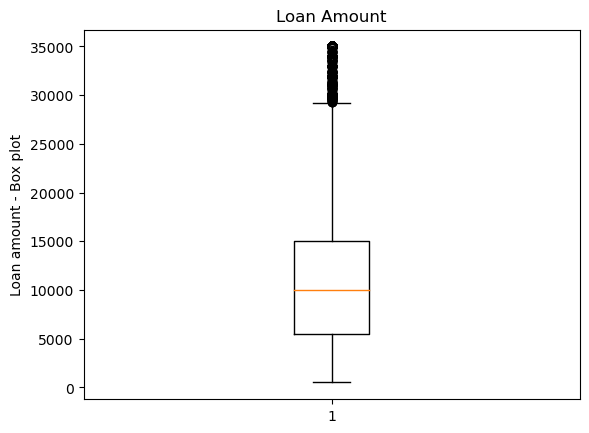

In [334]:
# The `loan_amnt` column indicates the amount of loan lent

boxplot(loan_data_set.loan_amnt, "Loan Amount", "Loan amount - Box plot")

- Removing `loan_amnt` outliers beyond the 95th percentile 

In [335]:
# Calculating the 95th percentile of `loan_amnt`

np.percentile(loan_data_set.loan_amnt, 95)

25000.0

In [336]:
# Removing the entries where the `loan_amnt is beyond the 95th percentile`

loan_data_set = loan_data_set[loan_data_set.loan_amnt <= 25000]

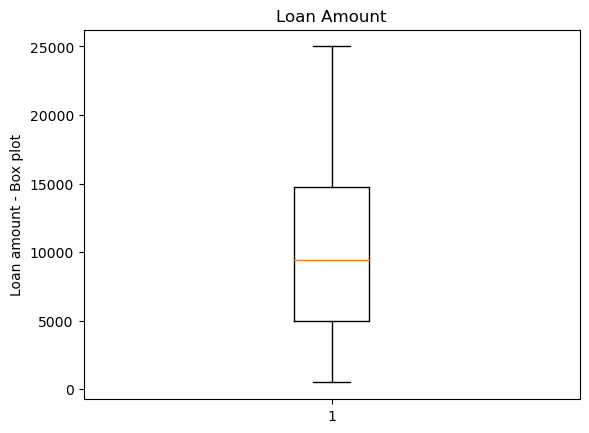

In [337]:
# Replotting `loan_amnt`

boxplot(loan_data_set.loan_amnt, "Loan Amount", "Loan amount - Box plot")

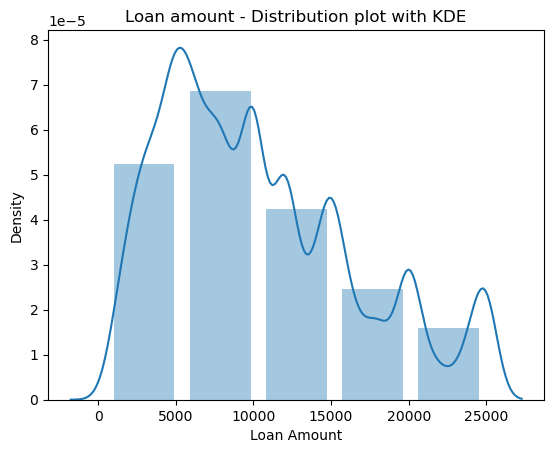

In [338]:
distplot(loan_data_set.loan_amnt, "Loan Amount", "Loan amount - Distribution plot with KDE")

#### Analysing the funded_amnt column 
- Funded amount is the actual amount lent

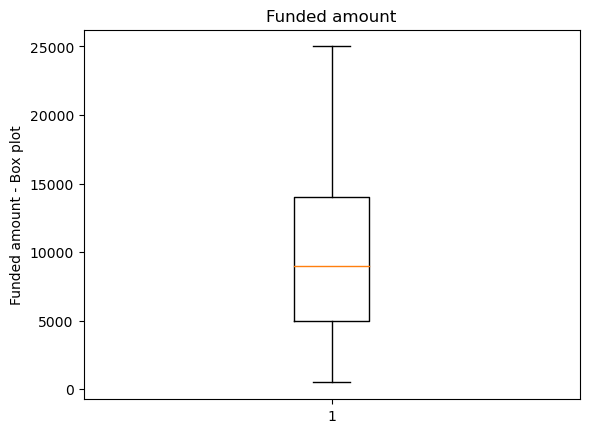

In [339]:
boxplot(loan_data_set.funded_amnt, "Funded amount", "Funded amount - Box plot")

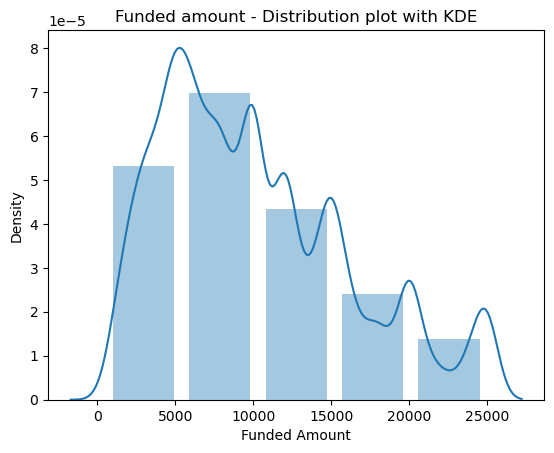

In [340]:
distplot(loan_data_set.funded_amnt, "Funded Amount", "Funded amount - Distribution plot with KDE")

- Processing the term and interest rate columns. Converting them into numerical data types for analysis

In [341]:
# On the column `term` a lamba expression is applied to remove the months string from the value and convert it into integer type

loan_data_set['term'] = loan_data_set['term'].apply(lambda x : int(x[:-7]))

In [342]:
# On the column `int_rate` a lamba expression is applied to remove the % string from the value and convert it into float type

loan_data_set['int_rate'] = loan_data_set.int_rate.apply(lambda x : float(x[:-1]))

#### Analysing the `term` and `int_rate` columns

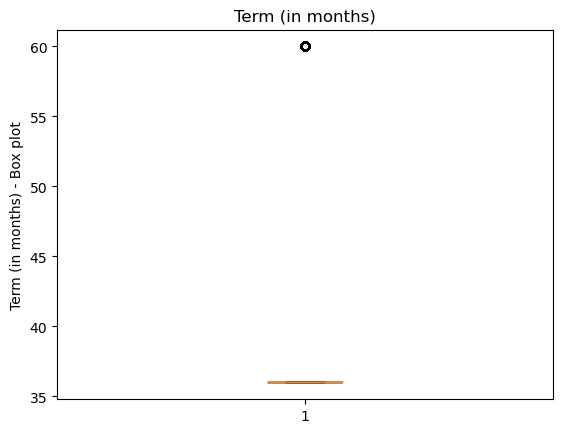

In [343]:
boxplot(loan_data_set.term, "Term (in months)", "Term (in months) - Box plot")

- From the box plot although the value 60 may seem to be an outlier, the term column is primarily made of 2 values 36 and 60 and the data set with 60 as term is significant and it may add value with the analysis. Hence, the decision has been made to not remove the outlier in this case

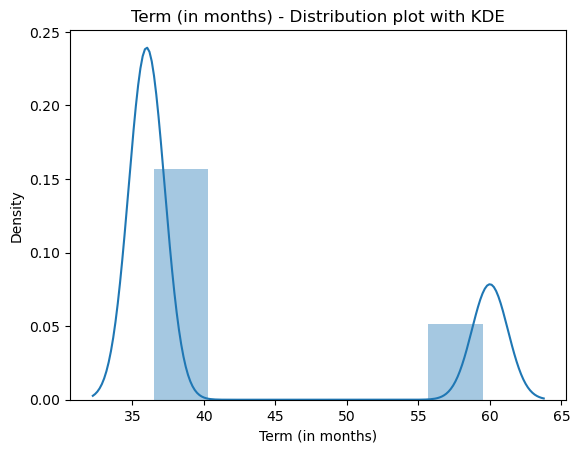

In [344]:
distplot(loan_data_set.term, "Term (in months)", "Term (in months) - Distribution plot with KDE")

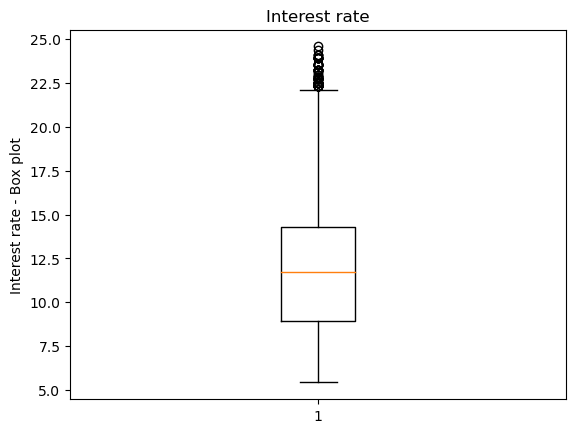

In [345]:
# plotting the box plot for int_rate

boxplot(loan_data_set.int_rate, "Interest rate", "Interest rate - Box plot")

In [346]:
# calculating the 95th percentile of the interest rate

np.percentile(loan_data_set.int_rate, 95)

18.25

In [347]:
# Remove int_rate outliers

loan_data_set = loan_data_set[loan_data_set.int_rate <= 18.25]

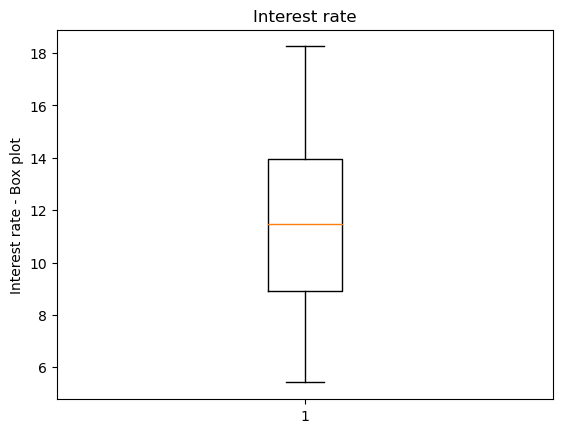

In [348]:
# Replotting int_rate

boxplot(loan_data_set.int_rate, "Interest rate", "Interest rate - Box plot")

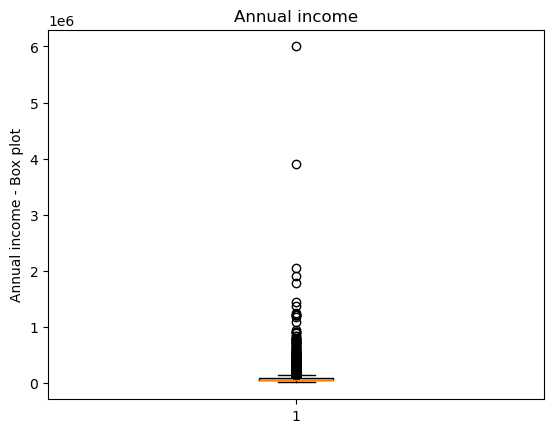

In [349]:
# Box plot of annual income

boxplot(loan_data_set.annual_inc, "Annual income", "Annual income - Box plot")

In [350]:
# Removing the `annual_income` outliers 

loan_data_set = loan_data_set[loan_data_set.annual_inc <= np.percentile(loan_data_set.annual_inc, 95)]

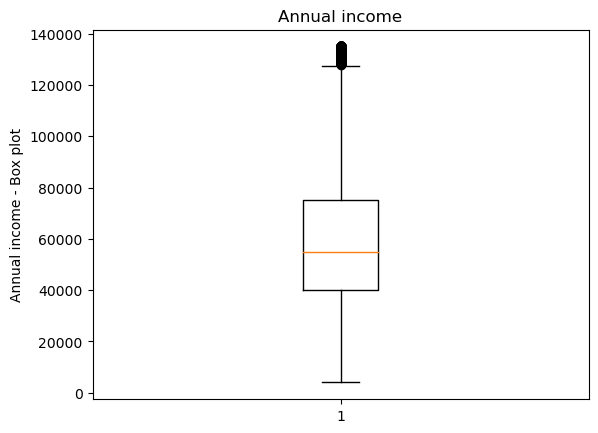

In [351]:
# Replotting the `annual_income`

boxplot(loan_data_set.annual_inc, "Annual income", "Annual income - Box plot")

In [356]:
loan_data_set.info(verbose=True, show_counts=True)



<class 'pandas.core.frame.DataFrame'>
Int64Index: 34615 entries, 0 to 39716
Data columns (total 57 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          34615 non-null  int64  
 1   member_id                   34615 non-null  int64  
 2   loan_amnt                   34615 non-null  int64  
 3   funded_amnt                 34615 non-null  int64  
 4   funded_amnt_inv             34615 non-null  float64
 5   term                        34615 non-null  int64  
 6   int_rate                    34615 non-null  float64
 7   installment                 34615 non-null  float64
 8   grade                       34615 non-null  object 
 9   sub_grade                   34615 non-null  object 
 10  emp_title                   32515 non-null  object 
 11  emp_length                  33613 non-null  object 
 12  home_ownership              34615 non-null  object 
 13  annual_inc                  346

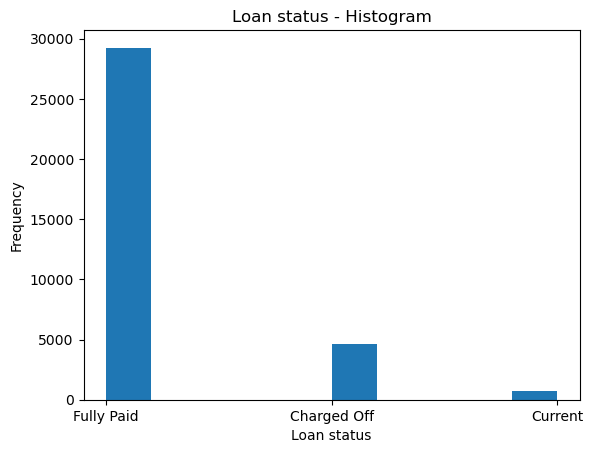

In [370]:
# understanding the `loan_status` using histogram

hist(loan_data_set.loan_status, "Loan status", "Loan status - Histogram")

In [373]:
# Removing the entries where the `loan_status` is current as this is still inconclusive

loan_data_set = loan_data_set[~(loan_data_set.loan_status == 'Current')]

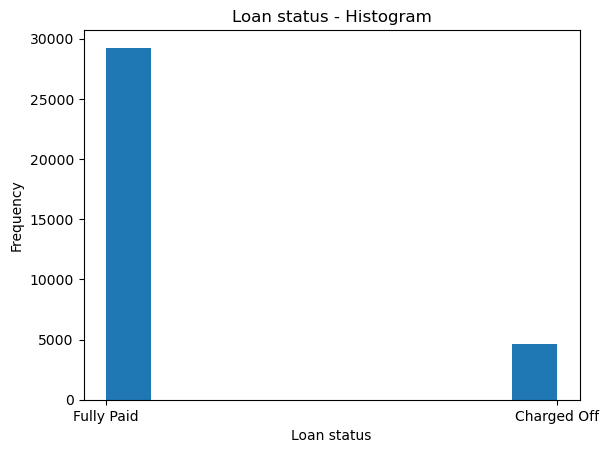

In [374]:
# Replotting histogram on `loan_status`

hist(loan_data_set.loan_status, "Loan status", "Loan status - Histogram")

In [375]:
# Removing the column `next_pymnt_d`
# Column `next_pymnt_d` indicates the date of the next payment but since we have removed the data of the current loan payer we can lose this column too

loan_data_set = loan_data_set.drop(columns = 'next_pymnt_d')

In [435]:
# Removing column `out_prncp` and `out_prncp_inv` as both these columns are only relevant in an ongoing loan
# `out_prncp` indicates Remaining outstanding principal for total amount funded

loan_data_set = loan_data_set.drop(columns = ['out_prncp', 'out_prncp_inv'])

In [440]:
# Since we aren't using NLP the desc column can be dropped

loan_data_set = loan_data_set.drop(columns = 'desc')

In [461]:
# Removing columns `chargeoff_within_12_mths` and `collections_12_mths_ex_med` and `tax_liens`
# Maximum values contained in `chargeoff_within_12_mths` and `collections_12_mths_ex_med` columns are 0 (33824) and about 45 (null). In case of `tax_liens` it is 30 null and the rest 0. Hence removing these as they are not likely to add value to the analysis

loan_data_set = loan_data_set.drop(columns = ['chargeoff_within_12_mths', 'collections_12_mths_ex_med', 'tax_liens'])

In [462]:
loan_data_set.shape

(33869, 50)

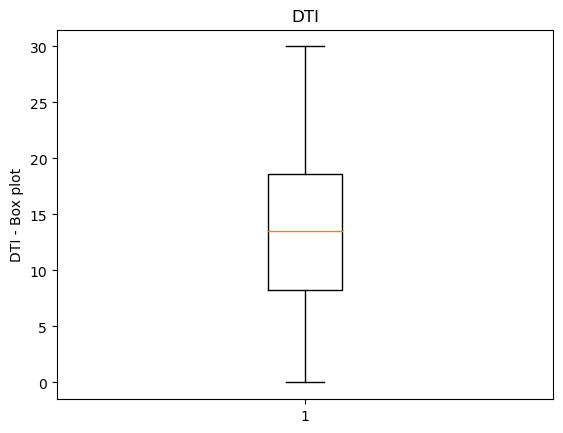

In [380]:
# analysing the column `dti`
# DTI - A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

boxplot(loan_data_set.dti, "DTI", "DTI - Box plot")

In [488]:
# The `verification_status` as per the data dictionary states 'Indicates if income was verified by LC, not verified, or if the income source was verified'
# But the data set contains 3 values 'Verified', 'Not Verified' and 'Source Verified'.
# Hence making the assumption that 'Source Verified' and 'Not Verified' are the same and replacing the values appropriately using the following lambda

loan_data_set.verification_status = loan_data_set.verification_status.apply(lambda x : 'Verified' if x == 'Source Verified' else x)


In [489]:
loan_data_set.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,policy_code,application_type,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,1,INDIVIDUAL,0,0,0.0
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,1,INDIVIDUAL,0,0,0.0
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,1,INDIVIDUAL,0,0,0.0
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,1,INDIVIDUAL,0,0,0.0
5,1075269,1311441,5000,5000,5000.0,36,7.90,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,0,Nov-04,3,NaN,NaN,9,0,7963,28.30%,12,f,5632.210000,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-15,161.03,Jan-16,1,INDIVIDUAL,0,0,0.0


In [490]:
loan_data_set.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33869 entries, 0 to 39716
Data columns (total 50 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       33869 non-null  int64  
 1   member_id                33869 non-null  int64  
 2   loan_amnt                33869 non-null  int64  
 3   funded_amnt              33869 non-null  int64  
 4   funded_amnt_inv          33869 non-null  float64
 5   term                     33869 non-null  int64  
 6   int_rate                 33869 non-null  float64
 7   installment              33869 non-null  float64
 8   grade                    33869 non-null  object 
 9   sub_grade                33869 non-null  object 
 10  emp_title                31818 non-null  object 
 11  emp_length               32899 non-null  object 
 12  home_ownership           33869 non-null  object 
 13  annual_inc               33869 non-null  float64
 14  verification_status   

## Data Analysis

### Univariate analysis on unordered categorical variables

#### Column addr_state
This can help us visualize which state gets the most amount of loans

In [629]:
def log_log_scale(x, y, title):
    plt.loglog(x, y, marker='o', linestyle='-', color='b')
    plt.title(title)
    plt.xlabel("Rank (log scale)")
    plt.ylabel("Frequency (log scale)")
    plt.show()
    
def get_ranks_and_freq(x):
    value_counts = x.value_counts()
    values = value_counts.index
    frequencies = value_counts.values
    ranks = np.arange(1, len(values) + 1)
    return (ranks, frequencies)

# p_col - parent column
# c_col - related sub column or child column

def stacked_bar_chart(p_col, c_col, title):
    state_zip_code_grouping = loan_data_set.groupby([p_col, c_col]).size().unstack(fill_value = 0)
    state_zip_code_grouping.plot(kind = 'bar', stacked = True, figsize = (10, 10))
    plt.title(title) #'Bar Chart of Sub-Grades within Each Grade'
    plt.xlabel(p_col)
    plt.ylabel('Count')
    plt.legend(title = c_col, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plt.show()

In [579]:
state_rank_freq_tuple = get_ranks_and_freq(loan_data_set.addr_state)

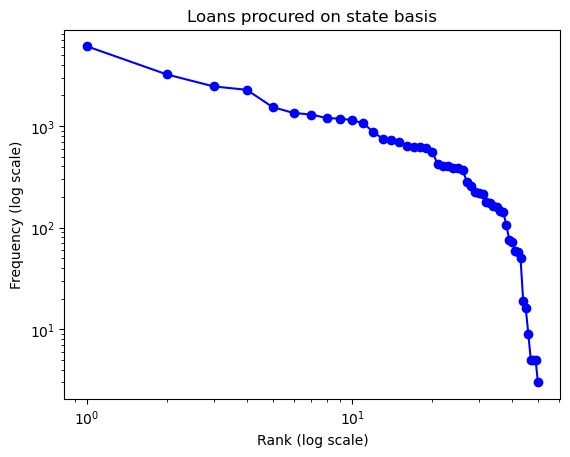

In [582]:
log_log_scale(state_rank_freq_tuple[0], state_rank_freq_tuple[1], "Loans procured on state basis")

#### The graph above is plotted against following data

In [585]:
loan_data_set.addr_state.value_counts()

CA    6083
NY    3216
FL    2452
TX    2270
NJ    1537
PA    1343
IL    1297
VA    1197
GA    1182
MA    1141
OH    1062
MD     869
AZ     750
WA     721
CO     692
NC     634
MI     623
CT     616
MO     612
MN     549
NV     420
SC     407
OR     402
AL     389
WI     385
LA     371
KY     283
OK     257
KS     226
UT     220
AR     215
DC     179
RI     175
NM     164
WV     158
HI     146
NH     143
DE     106
MT      76
WY      72
AK      59
SD      58
VT      50
MS      19
TN      16
IN       9
IA       5
NE       5
ID       5
ME       3
Name: addr_state, dtype: int64

#### The same analysis can be done on the zip_code column too (unordered categorical variable)

In [622]:
zip_code_rank_freq_tuple = get_ranks_and_freq(loan_data_set.zip_code)

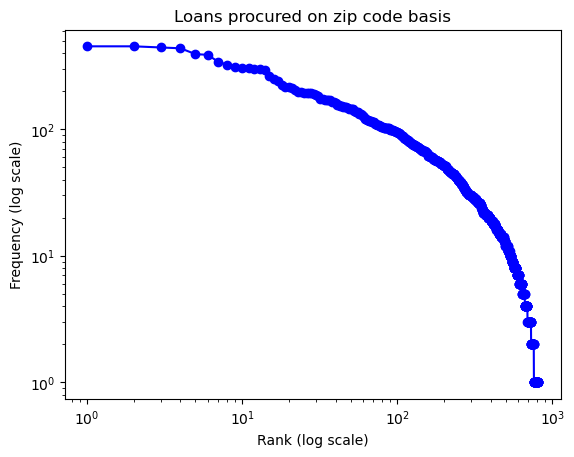

In [623]:
log_log_scale(zip_code_rank_freq_tuple[0], zip_code_rank_freq_tuple[1], "Loans procured on zip code basis")

#### The graph above is plotted against following data

In [624]:
loan_data_set.zip_code.value_counts()

945xx    453
100xx    453
112xx    444
606xx    437
900xx    393
        ... 
381xx      1
592xx      1
378xx      1
792xx      1
469xx      1
Name: zip_code, Length: 810, dtype: int64

#### Creating a column that has state and zip code in this format (state_zipcode) eg) AK_995xx

In [631]:
loan_data_set['state_zip_code'] = loan_data_set.addr_state + '_' + loan_data_set.zip_code

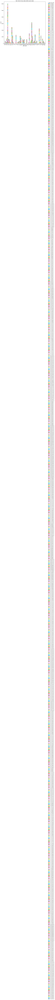

In [632]:
# This can give you a rough idea of the loans procured in zip code within each state

stacked_bar_chart('addr_state', 'state_zip_code', 'Bar Chart of zip codes within each state')

#### The same analysis can be done on the grade column too (unordered categorical variable)

In [581]:
grade_rank_freq_tuple = get_ranks_and_freq(loan_data_set.grade)

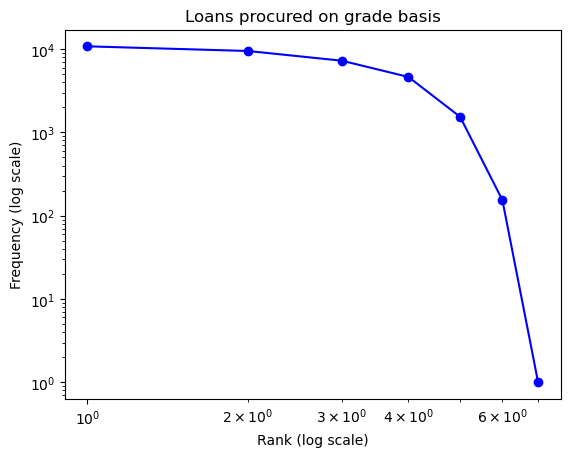

In [583]:
log_log_scale(grade_rank_freq_tuple[0], grade_rank_freq_tuple[1], "Loans procured on grade basis")

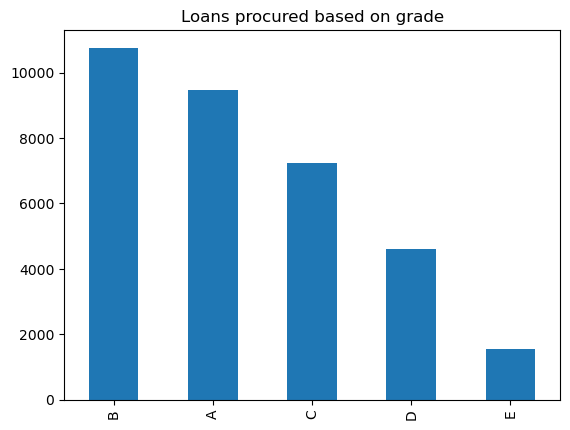

In [1079]:
# or a simple bar graph can give you an idea of the distribution

loan_data_set.grade.value_counts().plot.bar()
plt.title("Loans procured based on grade")
plt.show()

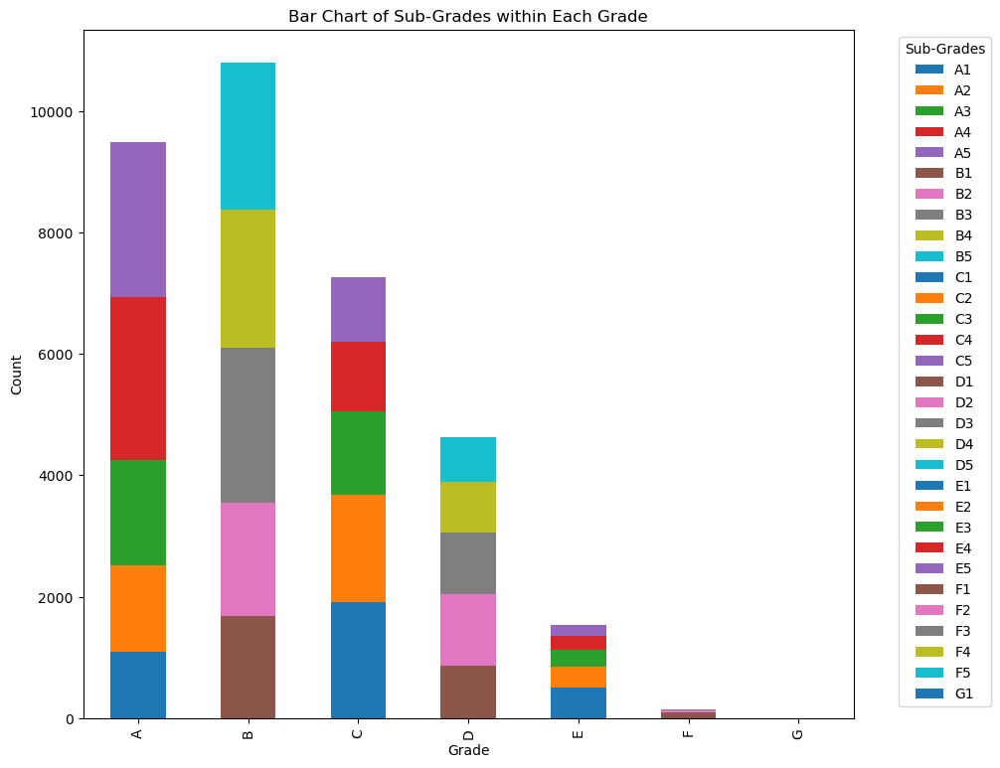

In [598]:
# To get a better idea of the distribution amongst the sub_grade we can do this 

stacked_bar_chart('grade', 'sub_grade', 'Bar Chart of sub-grades within each grade')

In [592]:
sub_grade_rank_freq_tuple = get_ranks_and_freq(loan_data_set.sub_grade)

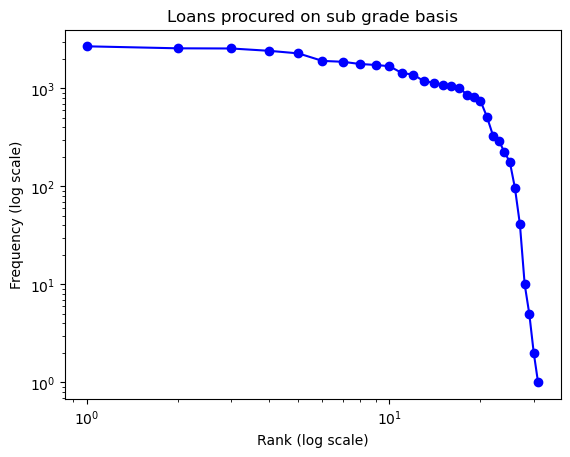

In [593]:
# Distribution of sub-grades on a log-log scale

log_log_scale(sub_grade_rank_freq_tuple[0], sub_grade_rank_freq_tuple[1], "Loans procured on sub grade basis")

In [594]:
loan_data_set.sub_grade.value_counts()

A4    2684
B3    2561
A5    2551
B5    2415
B4    2273
C1    1906
B2    1867
C2    1771
A3    1733
B1    1681
A2    1431
C3    1381
D2    1181
C4    1144
A1    1092
C5    1056
D3    1018
D1     865
D4     822
D5     745
E1     513
E2     330
E3     293
E4     223
E5     178
F1      96
F2      41
F4      10
F3       5
F5       2
G1       1
Name: sub_grade, dtype: int64

#### Anlysis based on the home ownership

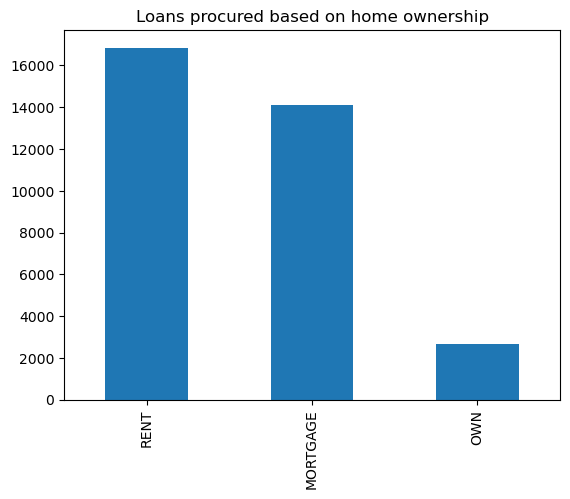

In [1080]:
loan_data_set.home_ownership.value_counts().plot.bar()
plt.title("Loans procured based on home ownership")
plt.show()

From the analysis of columns `home_ownership` and `grade`, the ouliers become evident. We can now remove the outliers 

- Outliers in case of `home_ownership` are 'OTHER' and 'NONE'
- Outliers in case of `grade` are 'F' and 'G'

In [611]:
loan_data_set = loan_data_set[~(loan_data_set.home_ownership.isin(['OTHER', 'NONE']))]

In [614]:
loan_data_set = loan_data_set[~(loan_data_set.grade.isin(['F', 'G']))]

#### Analysing the emp_length (i.e.) Employment length column

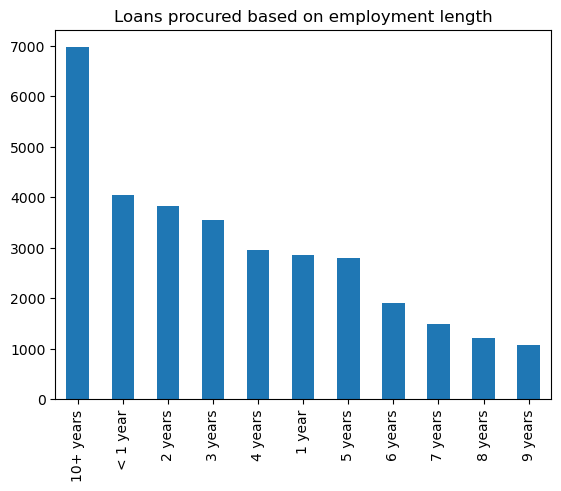

In [617]:
loan_data_set.emp_length.value_counts().plot.bar()
plt.title("Loans procured based on employment length")
plt.show()

#### Analysing the loans procured based on the verification status of income

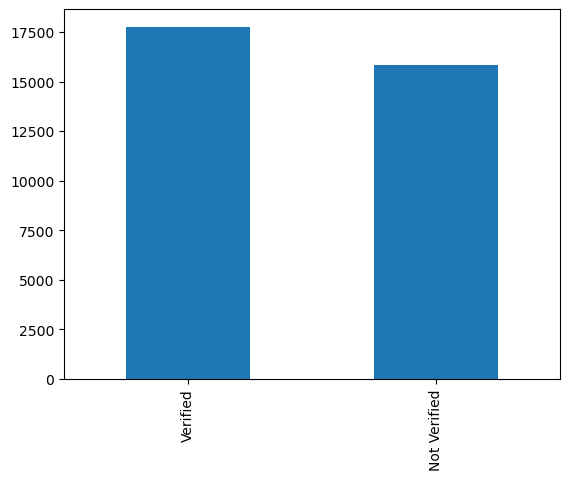

In [619]:
loan_data_set.verification_status.value_counts().plot.bar()
plt.show()

### Univariate analysis on ordered categorical variables

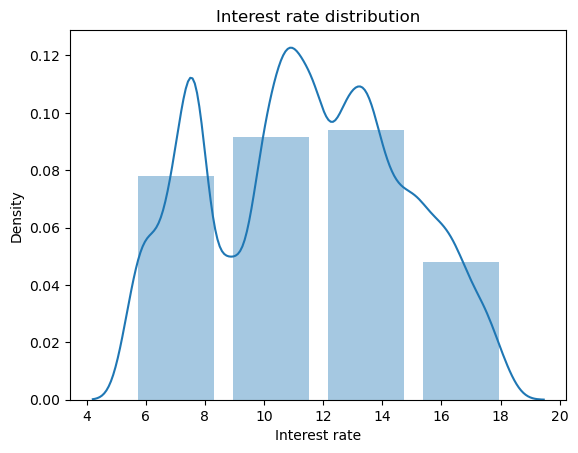

In [636]:
distplot(loan_data_set.int_rate, 'Interest rate', 'Interest rate distribution', bins = 4)

#### Adding columns `loan_issued_year` and `loan_issued_month`

In [650]:
# Converting issue_d into the datetime type and assigning it to a new column named `issue_date`

loan_data_set['issue_date'] = loan_data_set.issue_d.apply(lambda x : datetime.strptime(x, "%b-%y"))

In [659]:
# extracting the year and month from the issue_date column and storing them into a new columns

loan_data_set['loan_issued_year'] = loan_data_set.issue_date.apply(lambda x : x.year)
loan_data_set['loan_issued_month'] = loan_data_set.issue_date.apply(lambda x : x.strftime('%B'))

#### Number of loans procured against each year

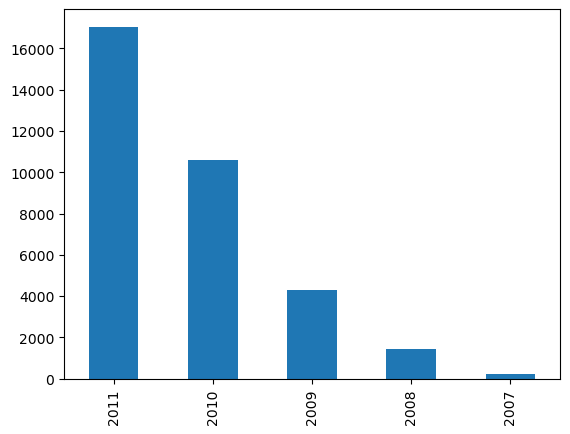

In [656]:
loan_data_set.loan_issued_year.value_counts().plot.bar()
plt.show()

#### An interesting insight here is that the number of loans issued every month increases

#### Number of loans procured against each month

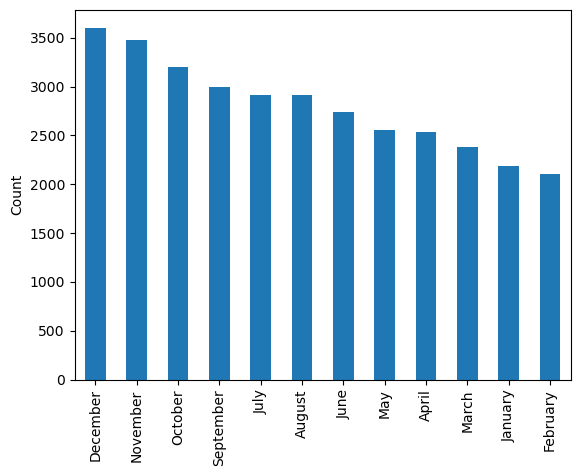

In [664]:
loan_data_set.loan_issued_month.value_counts().plot.bar()
plt.ylabel('Count')
plt.show()

#### Another interesting insight in the graph shown above is that the number of loans obtained increases with each month. The most amount of loans is obtained in Dec. A potential reason could be Christmas

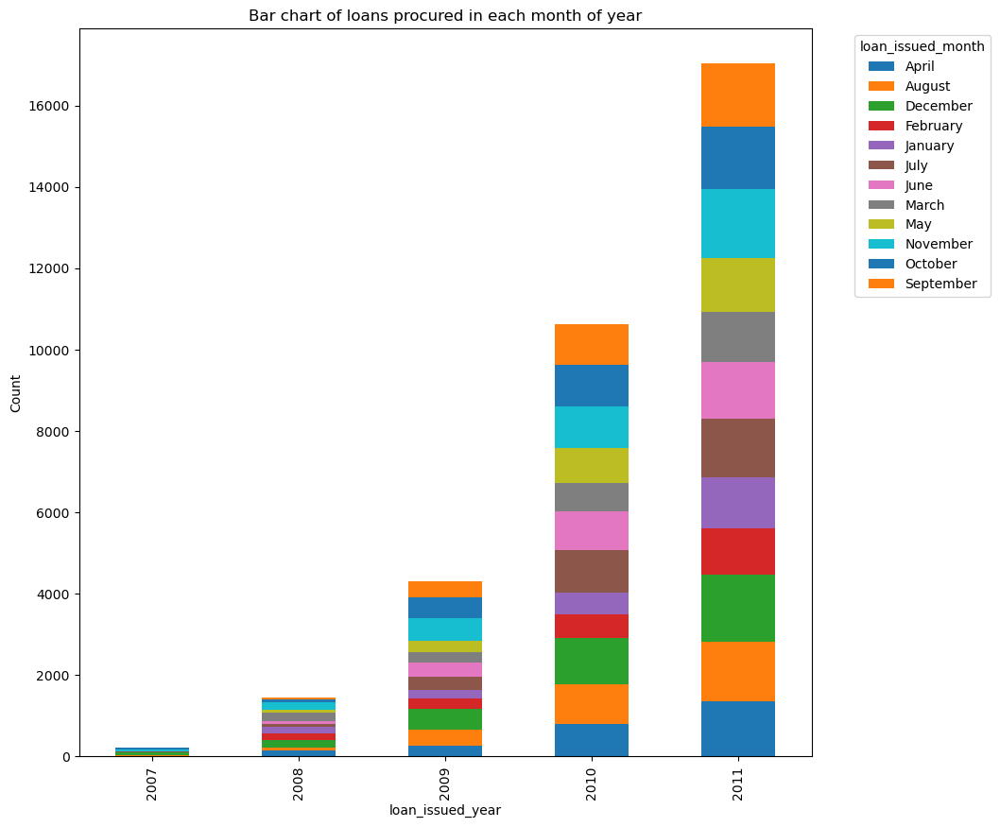

In [663]:
stacked_bar_chart('loan_issued_year', 'loan_issued_month', "Bar chart of loans procured in each month of year")

#### The graph shown above gives us a rough understanding of the distribution of loans every month from 2007 through 2011 

### Segmented univariate analysis

In [834]:
def segment_against_loan_status(col, figsize = (10, 8)):
    pivoted_table = loan_data_set.pivot_table(index = col, columns = 'loan_status', aggfunc = 'size', fill_value = 0)
    pivoted_table.plot(kind = 'bar', figsize = figsize)
    plt.show()

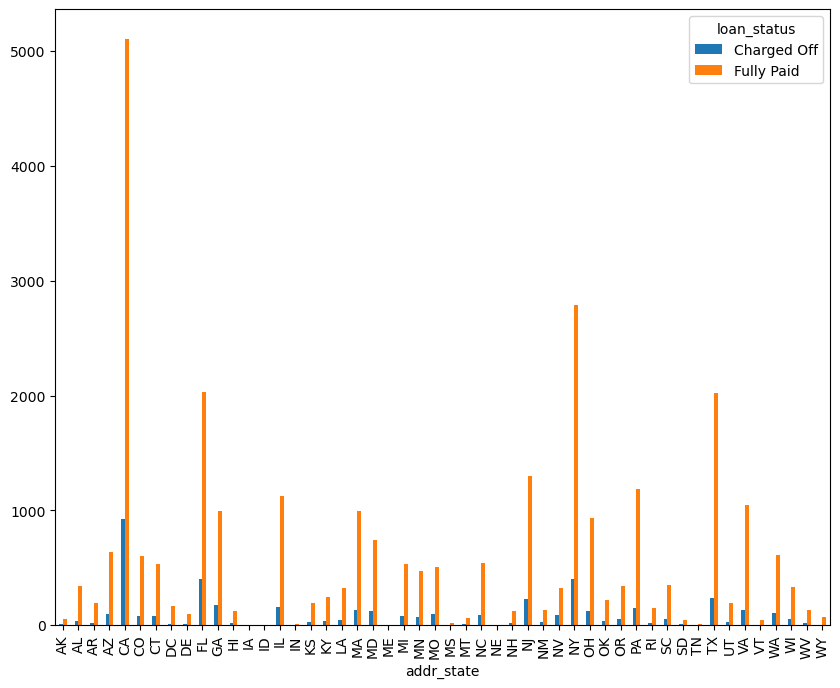

In [836]:
# Segmenting `loan_status` based on state

segment_against_loan_status('addr_state')

#### This graph shown above gives us an understanding of the distribution of the loans repaid and charged off based in different states

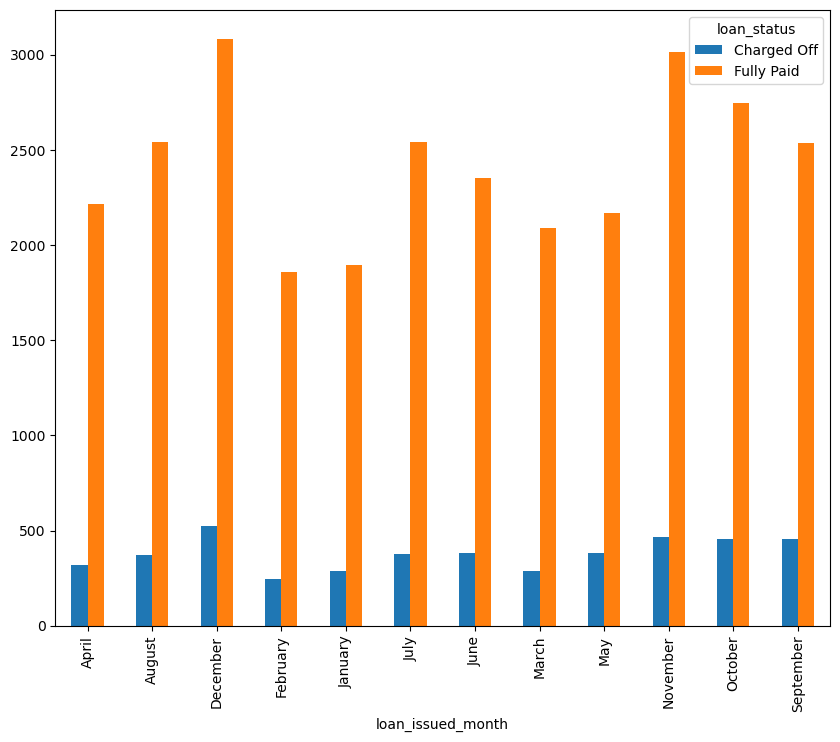

In [837]:
# Segmenting `loan_status` based on loan_issued_month

segment_against_loan_status('loan_issued_month')

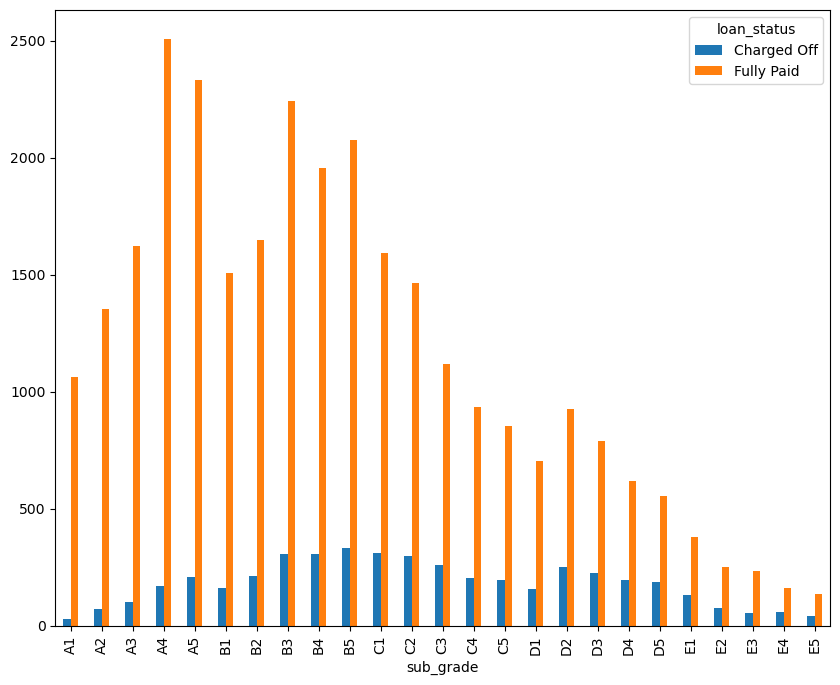

In [838]:
# Segmenting `loan_status` based on sub_grade

segment_against_loan_status('sub_grade')

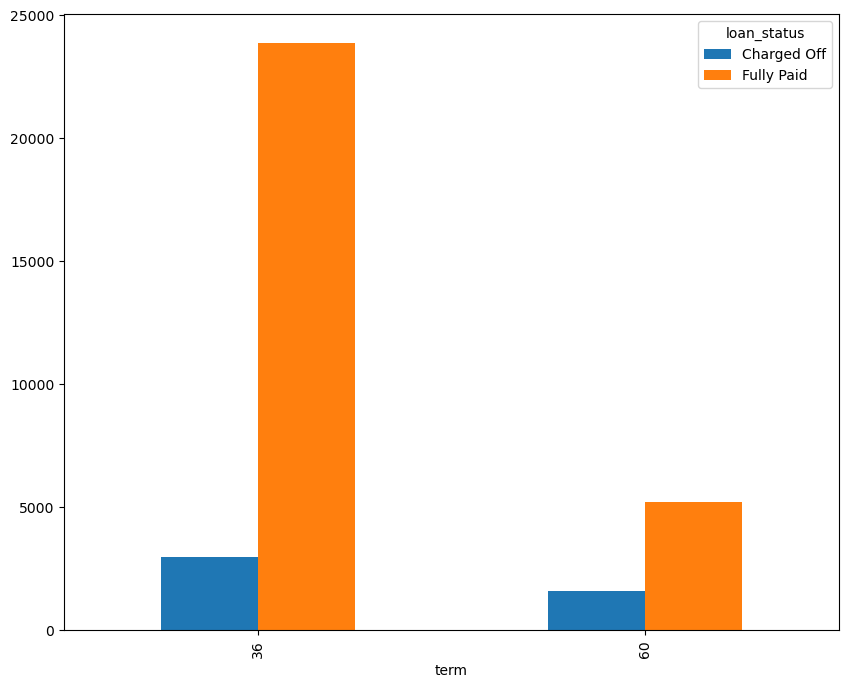

In [839]:
# Segmenting `loan_status` based on term

segment_against_loan_status('term')

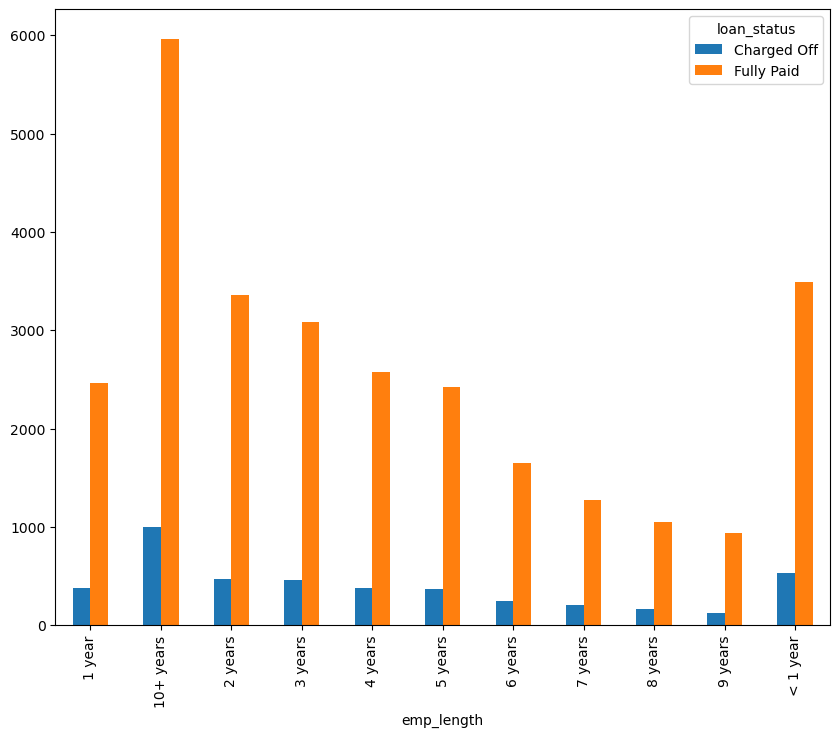

In [840]:
# Segmenting `loan_status` based on employment length

segment_against_loan_status('emp_length')

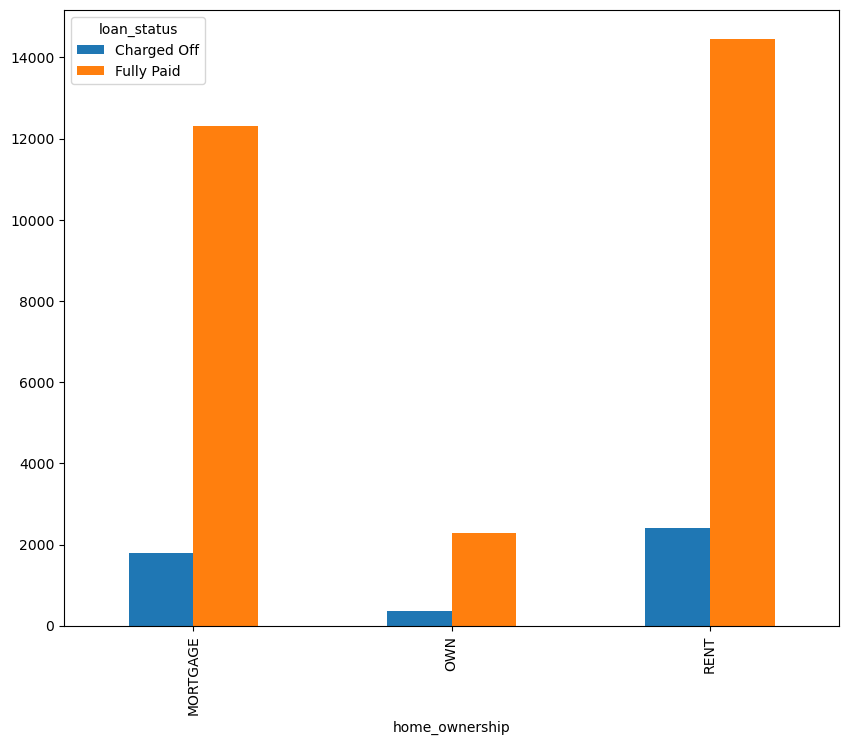

In [841]:
# Segmenting `loan_status` based on home ownership

segment_against_loan_status('home_ownership')

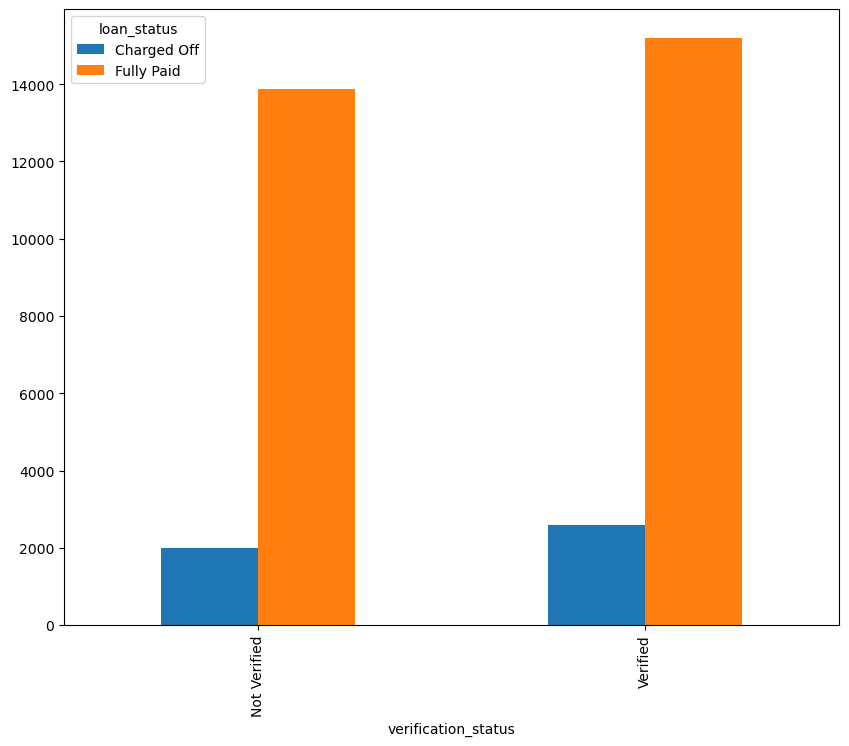

In [842]:
# Segmenting `loan_status` based on the income verification status

segment_against_loan_status('verification_status')

In [728]:
# Manipulating the revol_util column so it can be used in our analysis

loan_data_set.revol_util = loan_data_set.revol_util.apply(lambda x : x if isinstance(x, float) else float(x))

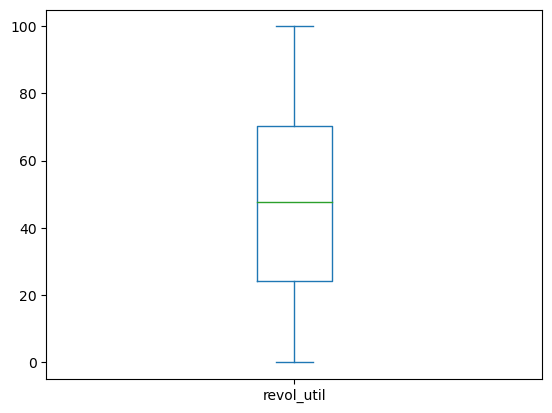

In [845]:
loan_data_set.revol_util.plot.box()
plt.show()

#### Segmenting the column `revol_util` for analysis

In [852]:
def segment(target_col_name, col_to_Segment, the_range):
    # Define the bin edges for segmentation
    bin_edges = the_range

    # Create segments using pd.cut()
    loan_data_set[target_col_name] = pd.cut(col_to_Segment, bins = bin_edges, labels = [f'{start}-{end}' for start, end in zip(bin_edges[:-1], bin_edges[1:])])

In [853]:
segment('revol_util_segment', loan_data_set.revol_util, range(0, 101, 5))

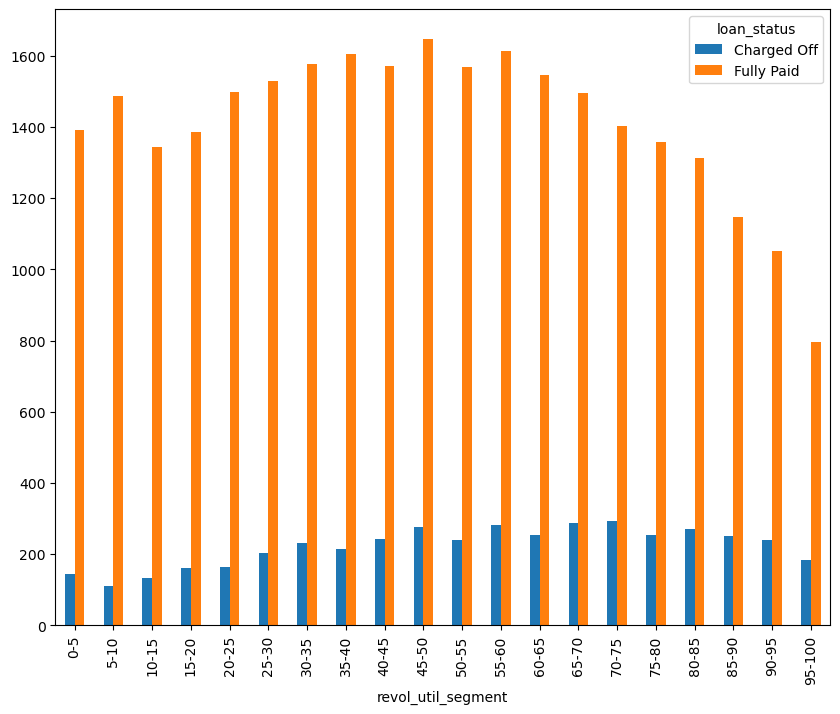

In [854]:
# Segmenting `loan_status` based on revol_util_segment

segment_against_loan_status('revol_util_segment')

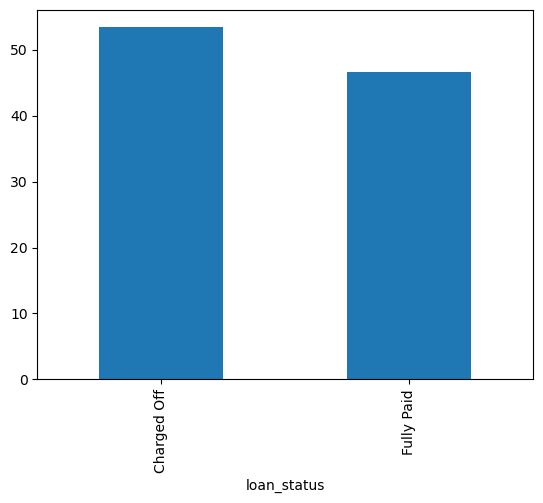

In [847]:
# mean of revol_util calculated for categories of loan_status

loan_data_set.groupby('loan_status')['revol_util'].mean().plot.bar()
plt.show()

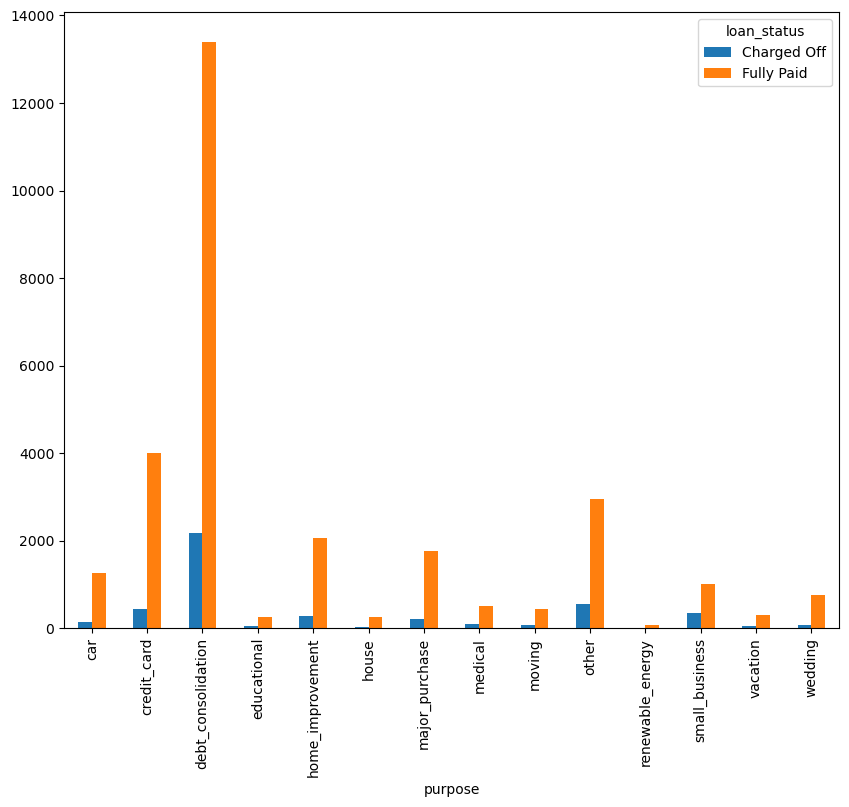

In [848]:
# Segmenting `loan_status` based on purpose

segment_against_loan_status('purpose')

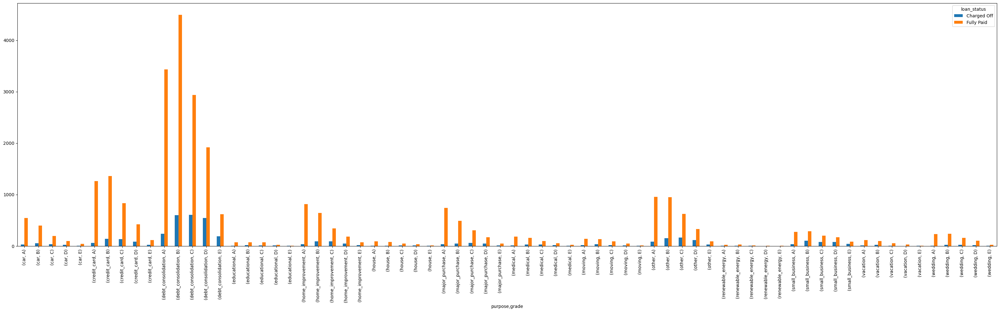

In [871]:
# Segmenting `loan_status` based on purpose and grade

segment_against_loan_status(['purpose', 'grade'], figsize = (40, 10))

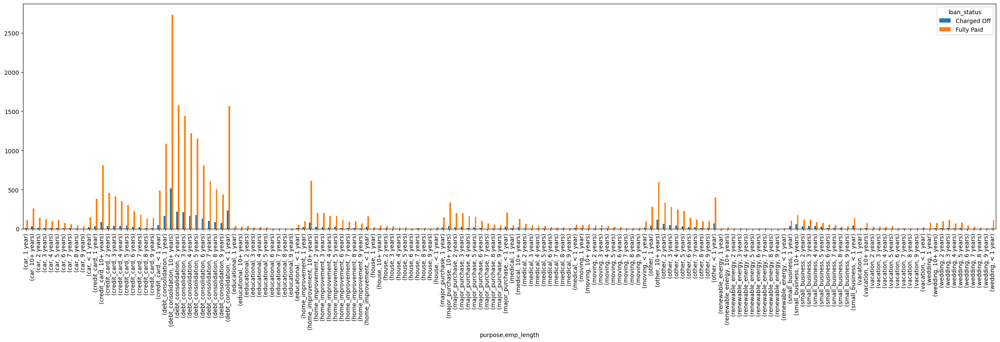

In [869]:
# Segmenting `loan_status` based on purpose and employment length

segment_against_loan_status(['purpose', 'emp_length'], figsize = (30, 7))

In [856]:
segment('annual_inc_slab', loan_data_set.annual_inc, range(0, 140001, 5000))

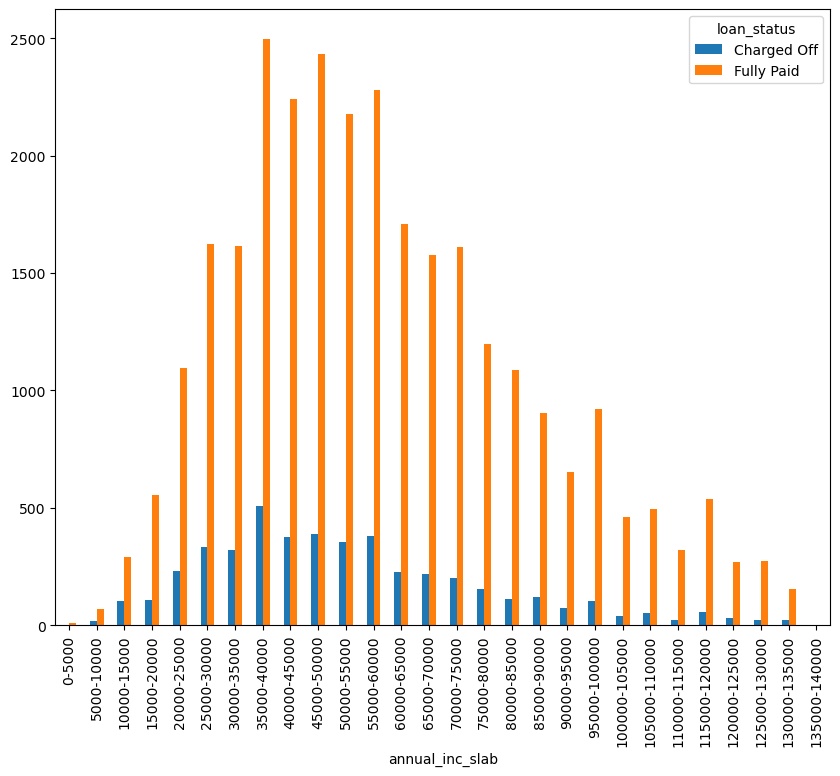

In [872]:
# Segment `loan_status` based on the annual income slab

segment_against_loan_status('annual_inc_slab')

In [861]:
# Segment the interest rate

segment('int_rate_slab', loan_data_set.int_rate, range(6, 19, 2))

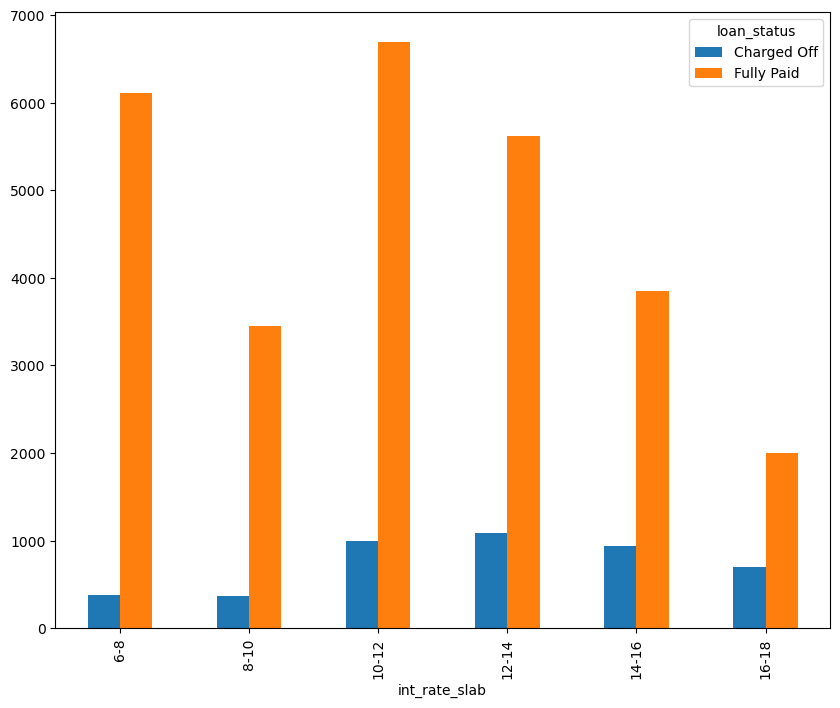

In [873]:
# Segment `loan_status` based on the interest rate slab

segment_against_loan_status('int_rate_slab')

In [863]:
segment('installment_segment', loan_data_set.installment, range(0, 1001, 100))

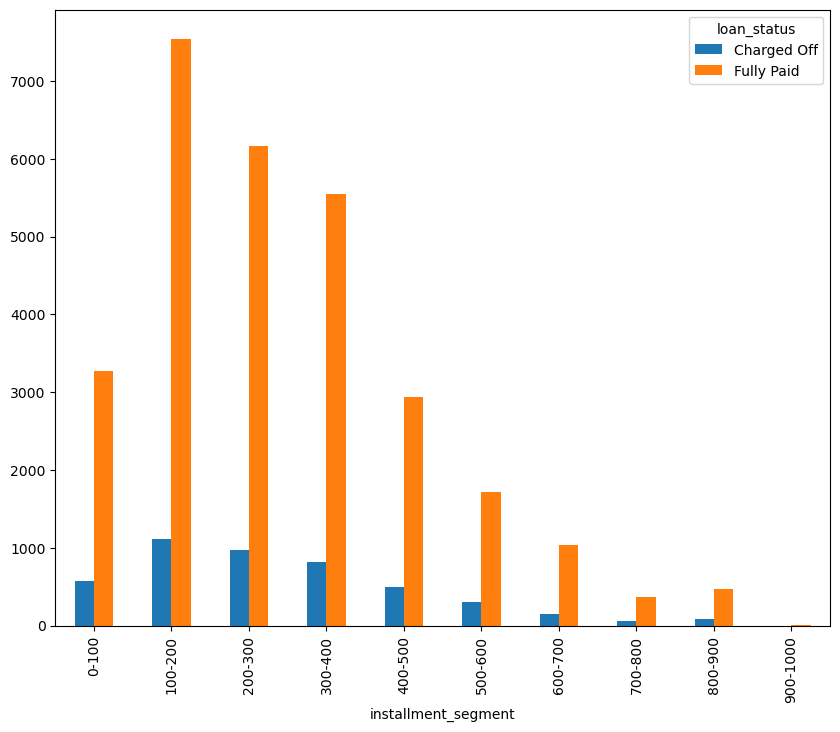

In [864]:
# Segment `loan_status` based on number of installments

segment_against_loan_status('installment_segment')

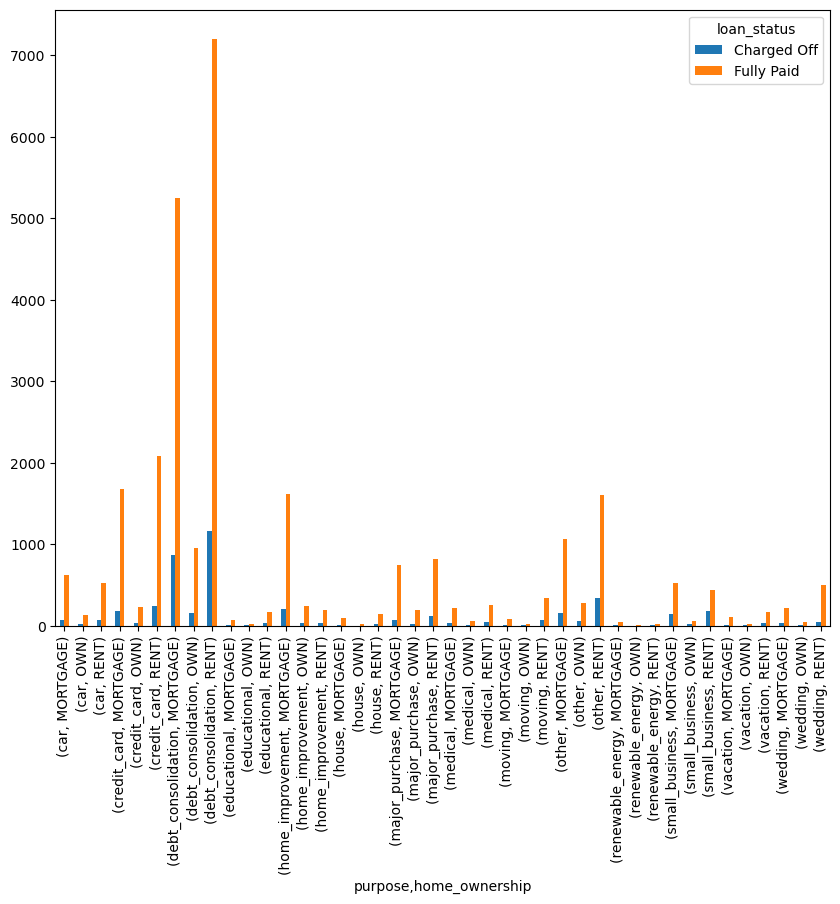

In [874]:
# Segment `loan_status` based on purpose and home ownership

segment_against_loan_status(['purpose', 'home_ownership'])

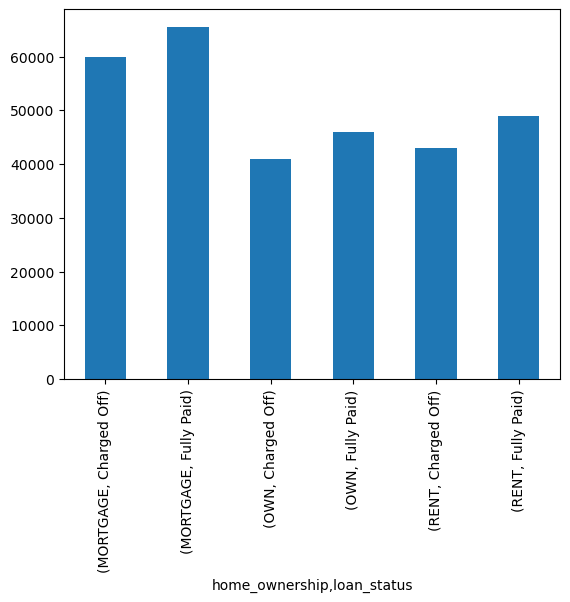

In [868]:
# Comparing the medians of the annual incomes by grouping the home ownership and loan status

loan_data_set.groupby(['home_ownership', 'loan_status'])['annual_inc'].median().plot.bar()
plt.show()

In [875]:
segment('dti_segment', loan_data_set.dti, range(0, 31, 5))

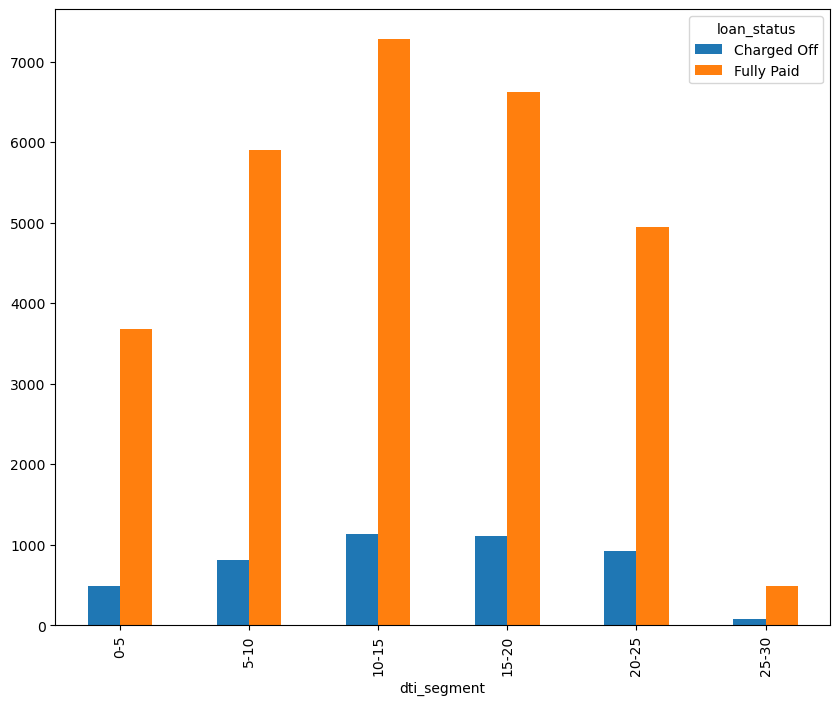

In [876]:
segment_against_loan_status('dti_segment')

In [878]:
# Convert the `earliest_cr_line` column to datetime, store it into a new column and then extract the year and months out of it

loan_data_set['earliest_cr_line_date'] = loan_data_set.earliest_cr_line.apply(lambda x : datetime.strptime(x, "%b-%y"))
loan_data_set['earliest_cr_line_year'] = loan_data_set.earliest_cr_line_date.apply(lambda x : x.year)
loan_data_set['earliest_cr_line_month'] = loan_data_set.earliest_cr_line_date.apply(lambda x : x.strftime('%B'))

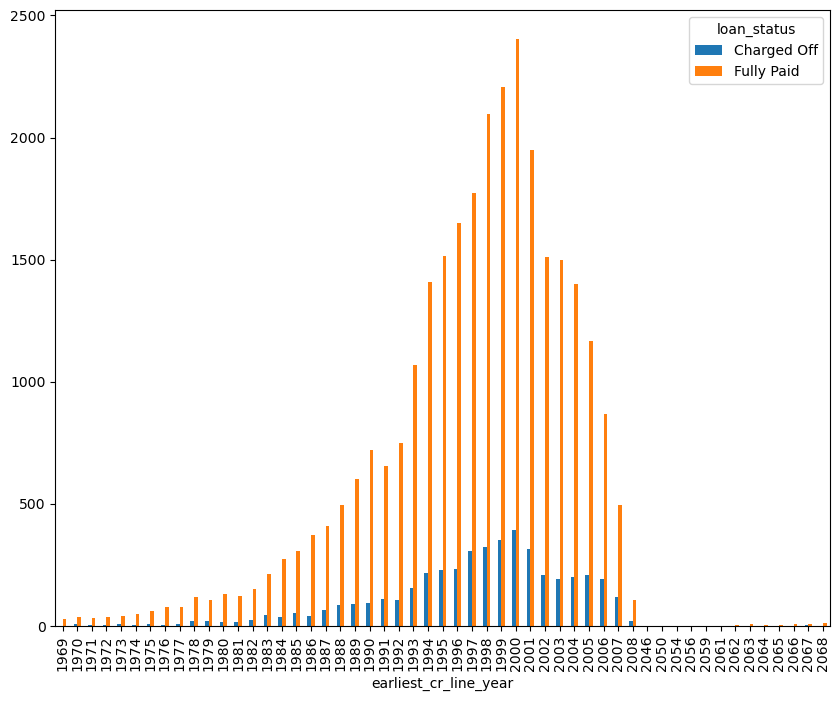

In [880]:
# Segment loan_status based on the year the borrower's earliest credit line was opened.
# Interestingly, the borrower's for whom the earliest credit line is in the year 2000 seem to have borrowed the most than the others

segment_against_loan_status('earliest_cr_line_year')

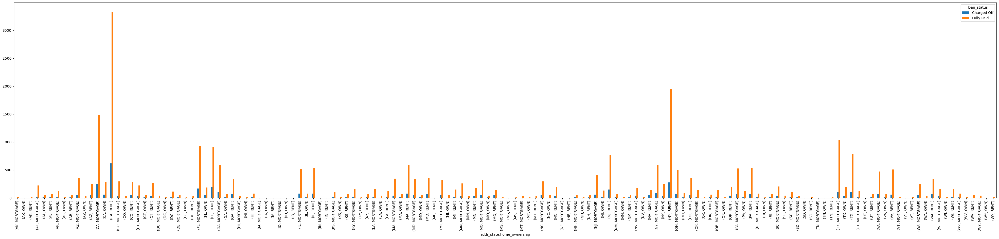

In [882]:
segment_against_loan_status(['addr_state', 'home_ownership'], figsize = (50, 10))

In [ ]:
# def scatter_plot(x_col, y_col):
    plt.figure(figsize = (10, 10))
    plt.scatter(loan_data_set[x_col][loan_data_set.loan_status == 'Fully Paid'], loan_data_set[y_col][loan_data_set.loan_status == 'Fully Paid'], c = 'orange', alpha = 0.6, label = 'Fully Paid')
    plt.scatter(loan_data_set[x_col][loan_data_set.loan_status == 'Charged Off'], loan_data_set[y_col][loan_data_set.loan_status == 'Charged Off'], c = 'b', alpha = 0.6, label = 'Charged Off')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend()
    plt.xticks(rotation = 90)
    plt.show()

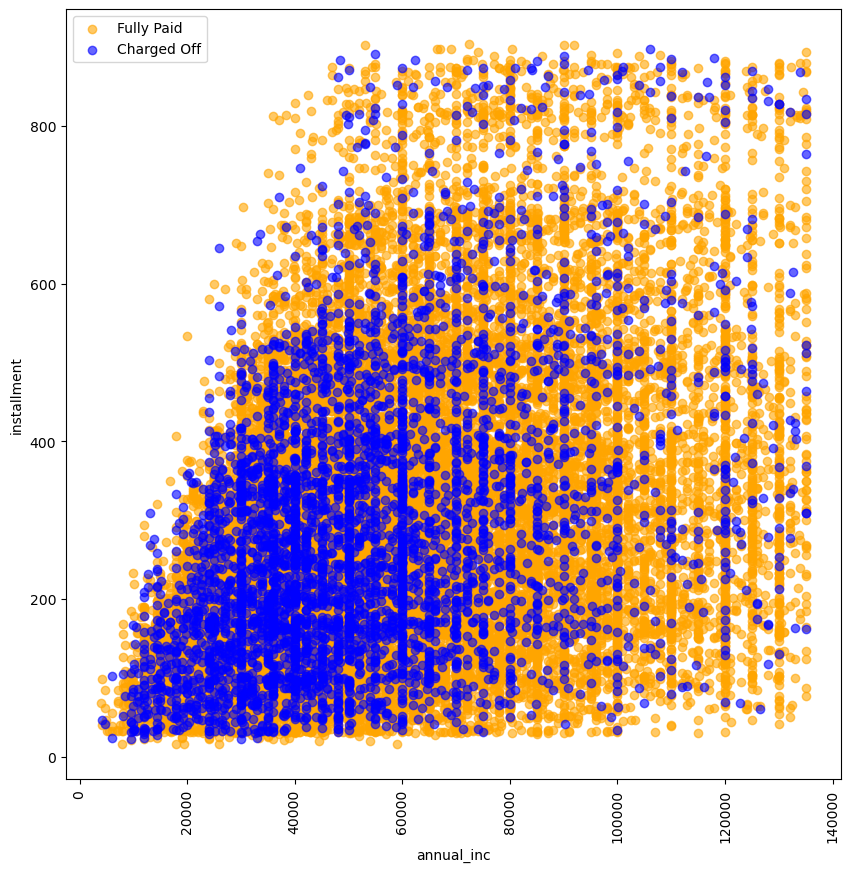

In [988]:
scatter_plot('annual_inc', 'installment')

### We can observe from the graph show above that the lesser the annual income and the lesser the number of installments the more likely the loan is charged off

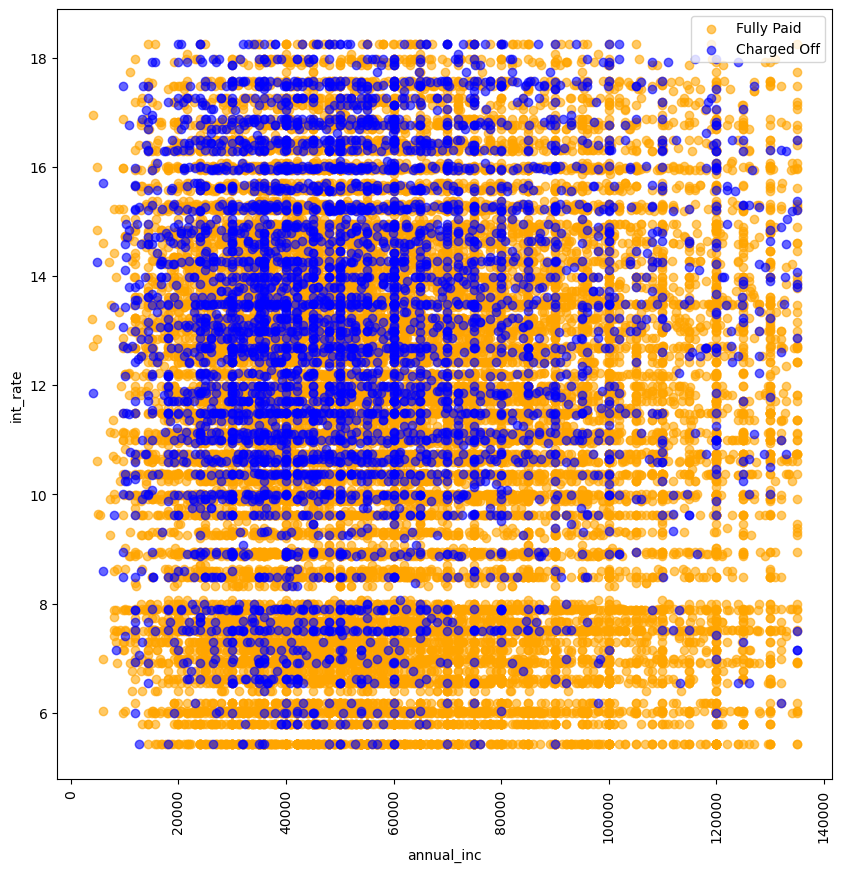

In [989]:
# A scatter plot that plots the relationship between the annual income and the interest rate. The greater the interest rate and lesser the income, it's more likely the loan is charged off

scatter_plot('annual_inc', 'int_rate')

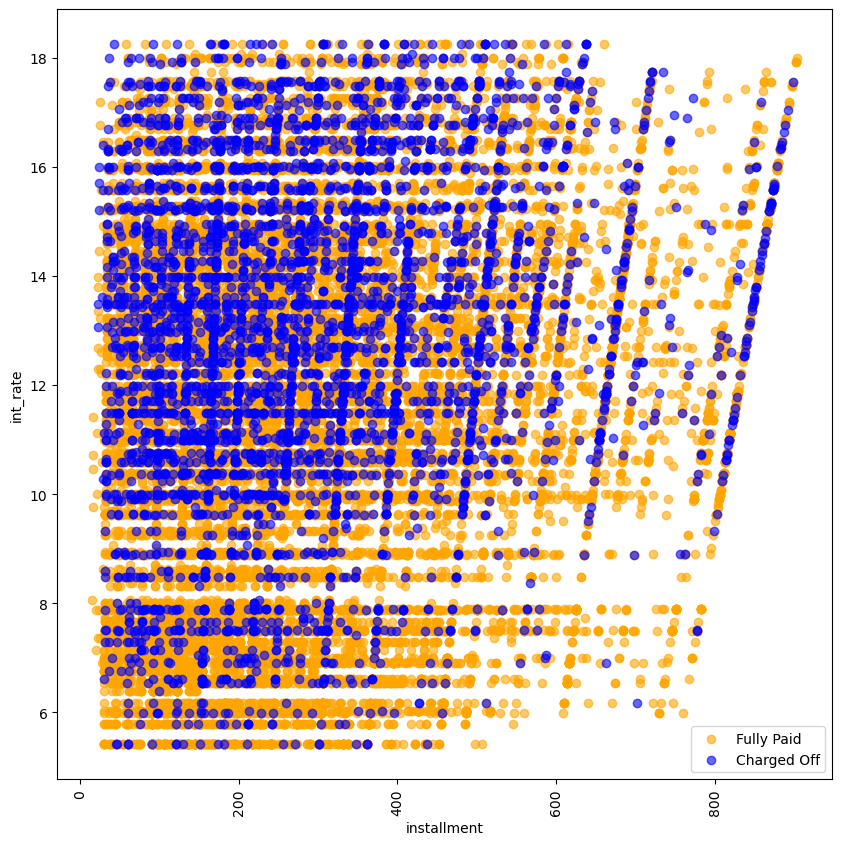

In [990]:
# Scatter plot showing the relationship between the installment and int_rate

scatter_plot('installment', 'int_rate')

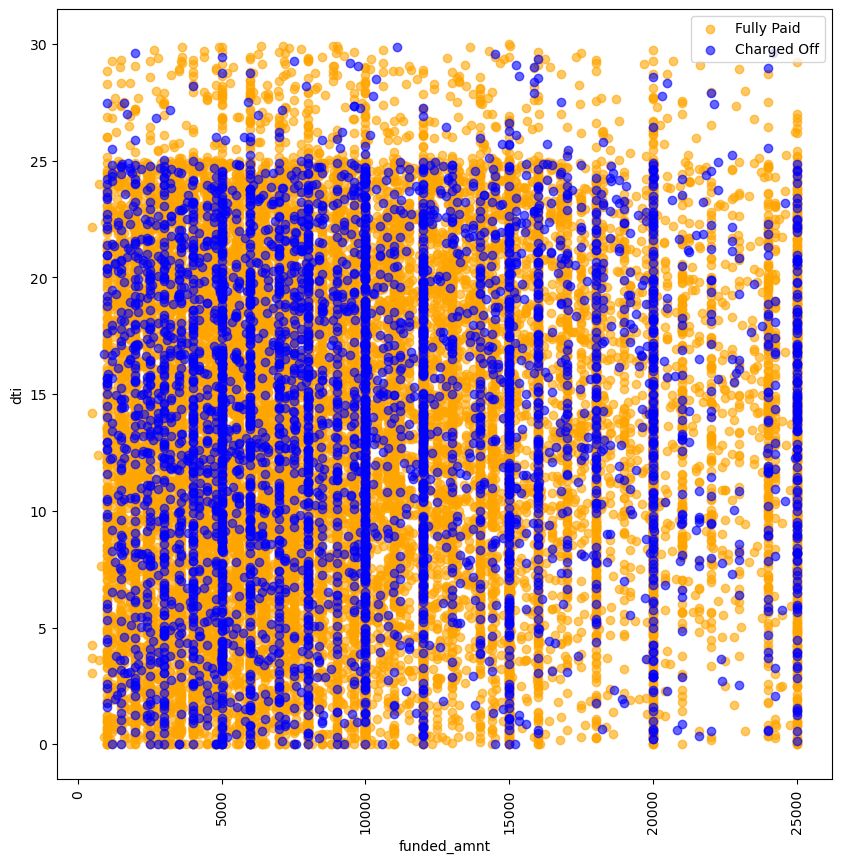

In [991]:
# Scatter plot showing the relationship between funded_amnt and dti

scatter_plot('funded_amnt', 'dti')

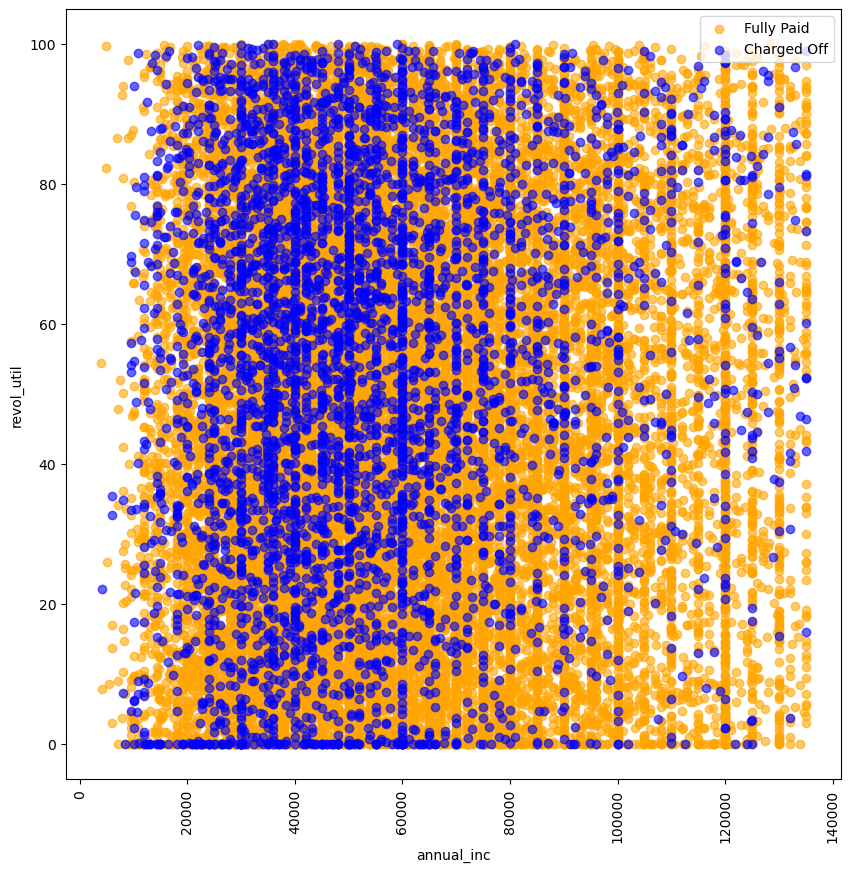

In [972]:
# Scatter plot showing the relationship between the annual income and revol_util

scatter_plot('annual_inc', 'revol_util')

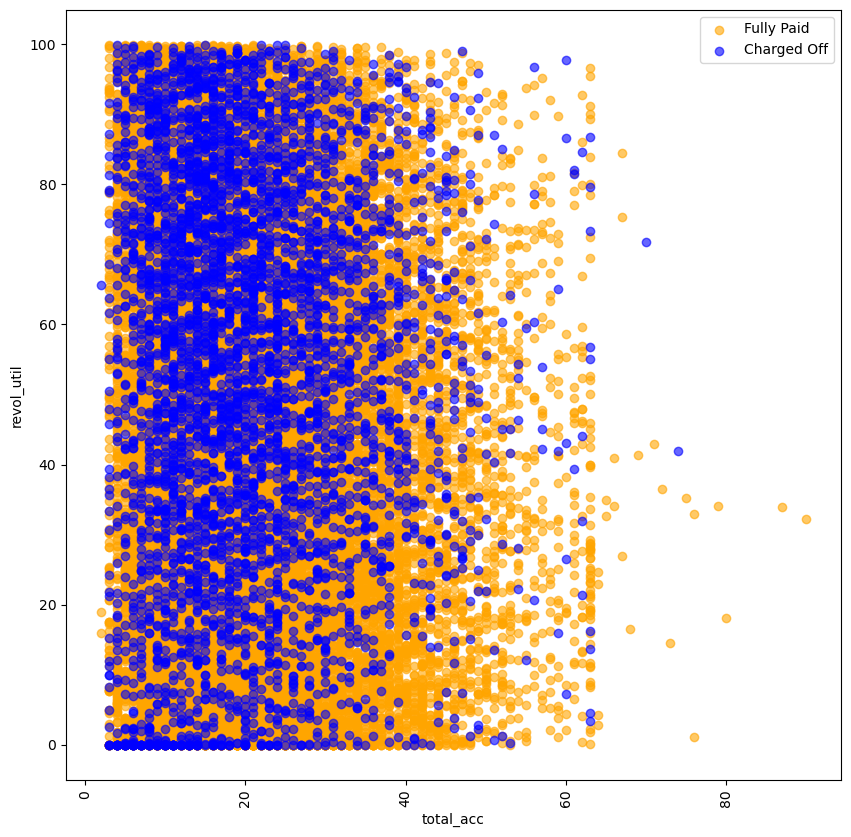

In [992]:
# Scatter plot showing the relationship between the total credit lines and revol_util. There is a strong pattern here that shows the lesser the total acc the more likely the loan gets charged off and it grows even stronger as the revol_util gets higher

scatter_plot('total_acc', 'revol_util')

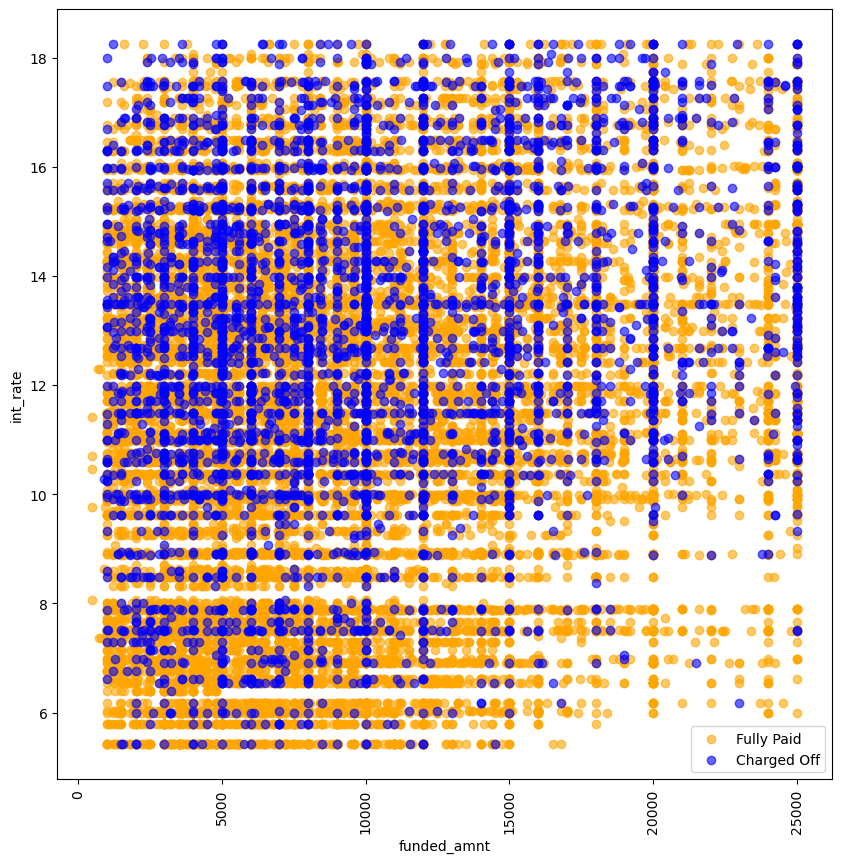

In [977]:
scatter_plot('funded_amnt', 'int_rate')

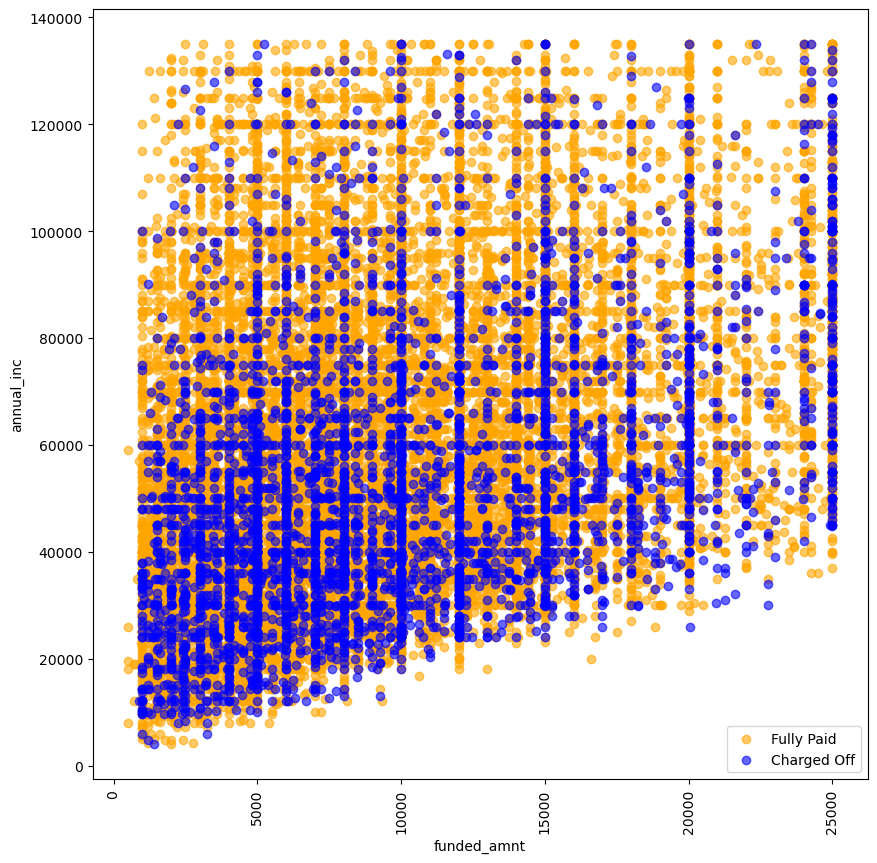

In [978]:
scatter_plot('funded_amnt', 'annual_inc')

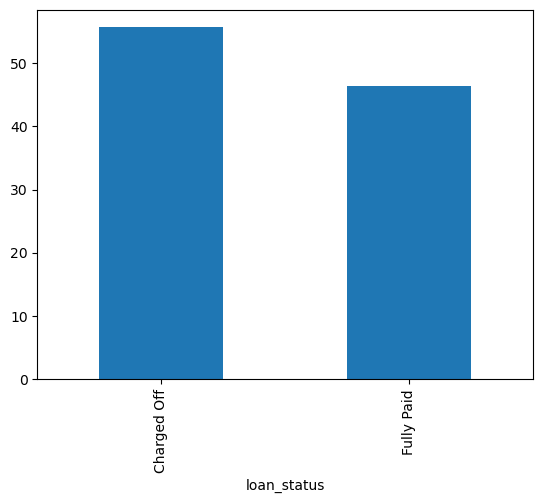

In [986]:
loan_data_set.groupby('loan_status')['revol_util'].median().plot.bar()
plt.show()

## Bivariate Analysis

In [1078]:
loan_data_set[['funded_amnt', 'annual_inc']].corr()

,funded_amnt,annual_inc
funded_amnt,1.000000,0.357676
annual_inc,0.357676,1.000000


In [1002]:
loan_data_set[loan_data_set.loan_status == 'Fully Paid'][['funded_amnt', 'int_rate']].corr()

,funded_amnt,int_rate
funded_amnt,1.000000,0.194226
int_rate,0.194226,1.000000


In [1072]:
# derived metric

loan_data_set['grade_ordinal'] = loan_data_set.grade.apply(lambda x : ord(x) - ord('A') + 1)

In [1076]:
# Positive correlation between the interest rate and the grade of the loans

np.corrcoef(loan_data_set.int_rate, loan_data_set.grade_ordinal)


array([[1.        , 0.93695039],
       [0.93695039, 1.        ]])

In [1077]:
loan_data_set[['annual_inc', 'installment']].corr()

,annual_inc,installment
annual_inc,1.000000,0.356145
installment,0.356145,1.000000
